In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sys
from scipy.signal import savgol_filter
from functools import cached_property
from scipy.ndimage import gaussian_filter
from scipy.spatial.distance import cosine
import pickle
import os
import json
import jcl

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [3]:
def raster_plot(spike_times, training1_end, trial_times, color='k'):
    unique_ids = np.arange(0,len(spike_times),1)
    lineoffsets = unique_ids + 1
    plt.figure(figsize=(18, 6), dpi=100)
    plt.eventplot(spike_times, lineoffsets=lineoffsets,linelengths=0.8, linewidths=0.5,color=color)
    plt.eventplot(trial_times, lineoffsets=lineoffsets,linelengths=0.8, linewidths=1.5,color='r')
    plt.axhline(y= training1_end, label="Sleep")
    plt.legend()
    plt.yticks(lineoffsets, unique_ids)
    plt.xlabel('Time')
    plt.ylabel('Trial')
    plt.show()

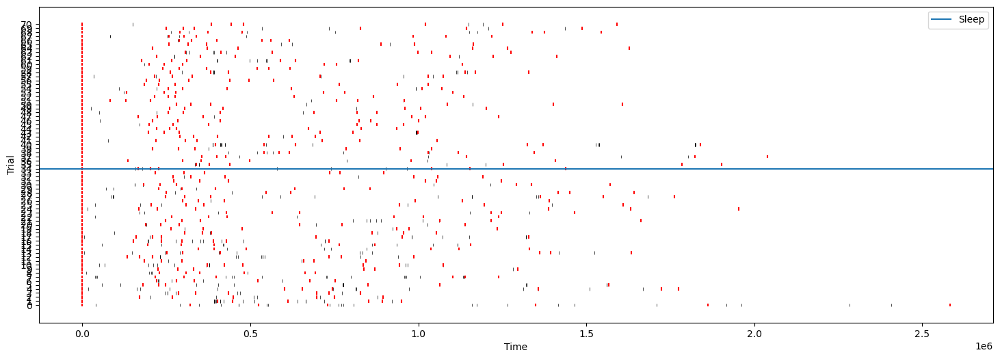

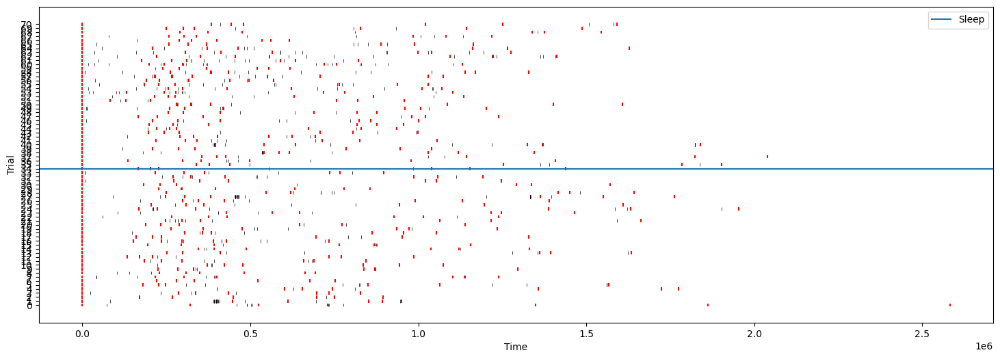

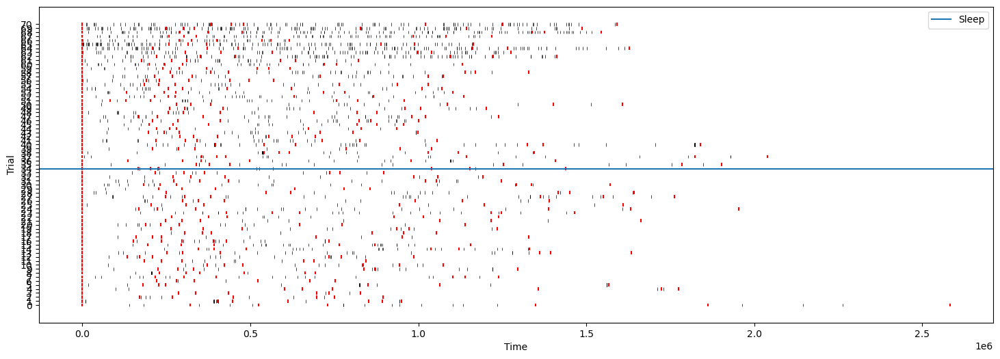

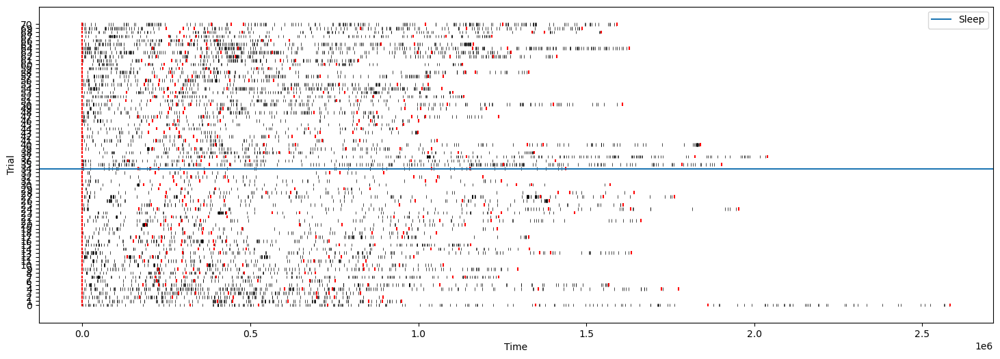

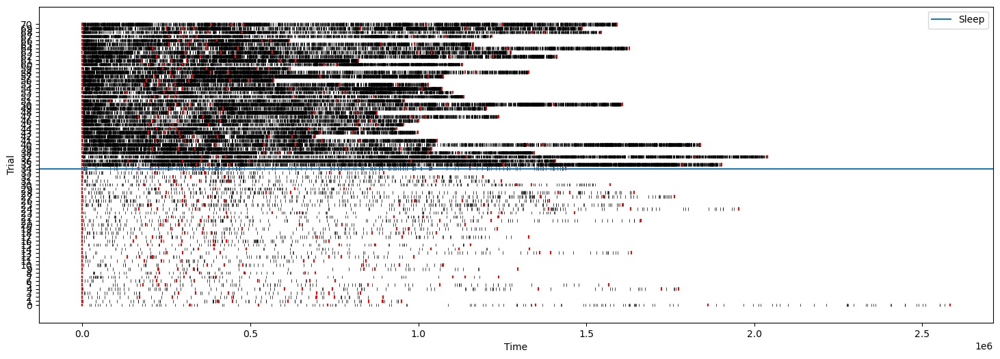

...

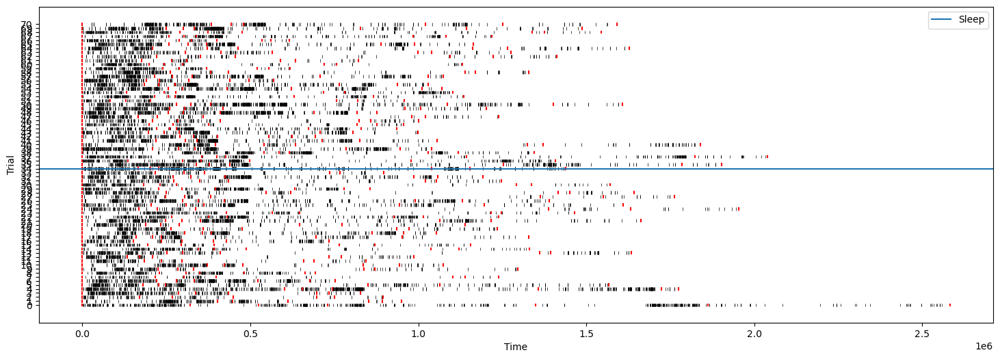

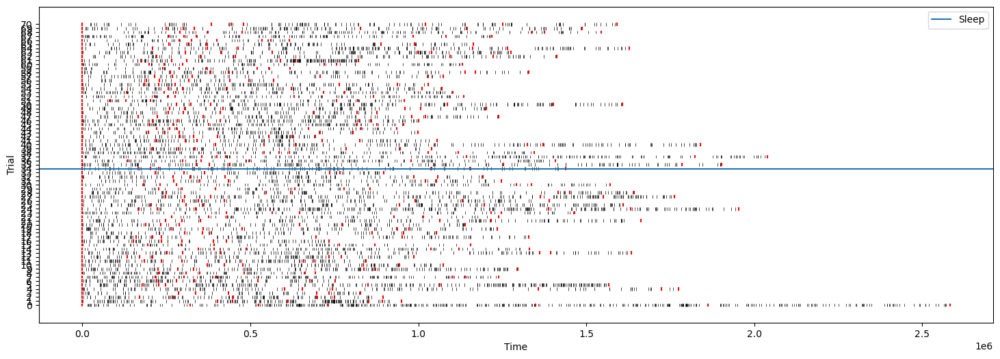

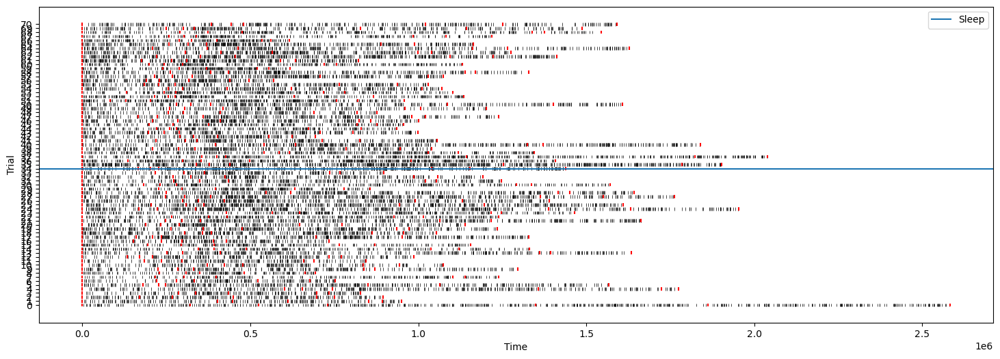

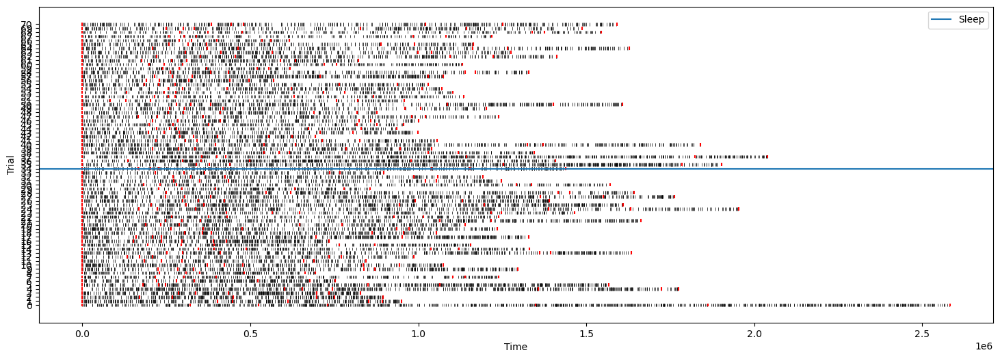

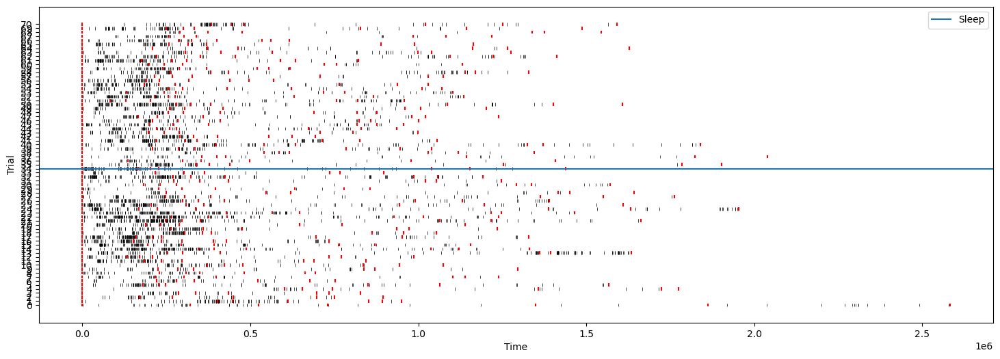

In [4]:
# days = ['20220909','20220910','20220920']
days = ['20220920']

rats = ["JC283"]
maze_type = 'andrea'
time_bin = 25.6      # in ms   20ms is 512 pts    20000/39.0625
clu_sampling = 20000
whl_sampling = 39.0625
whl_to_clu = clu_sampling/whl_sampling

for rat in rats:
    for day in days:
        path = "./m" + rat + "-" + day + "/"
        
        des_path = path + rat + "-" + day + '.des'
    
        with open(des_path, 'r') as file:
            des = np.array(file.read().split())
        
        for cell_id in range(len(des)):
            if des[cell_id] == "pp":
                spike_matrix = []  
                trial_matrix = []

                for training_num in [1,2]:

                    clu_path = path + rat + "-" + day + '_training' + str(training_num) + '.clu'
                    res_path = path+ rat + "-" + day + '_training' + str(training_num) + '.res'
                    spike_times = jcl.load.spike_times_from_res_and_clu( res_path, clu_path, exclude_clusters=[0, 1]  )
                    file_path = path + rat + "-" + day + '_training' + str(training_num) + '.trials'

                    cell_spikes = spike_times[cell_id]

                    with open(file_path,'r') as f:
                        for trial in f:
                            trial = np.array(trial.split(" "), dtype = int)
                            spike_matrix.append( cell_spikes[ (cell_spikes >= trial[0]*whl_to_clu) & (cell_spikes <= trial[-1]*whl_to_clu)] - trial[0]*whl_to_clu) 
                            trial_matrix.append( (trial - trial[0])*whl_to_clu )
#                     print(trial_matrix)
                            ## appending by fixing the start of the trial as time 0
                    f.close()
                    if training_num == 1 :
                        training1_end = len(spike_matrix)
                raster_plot(spike_matrix, training1_end, trial_matrix)

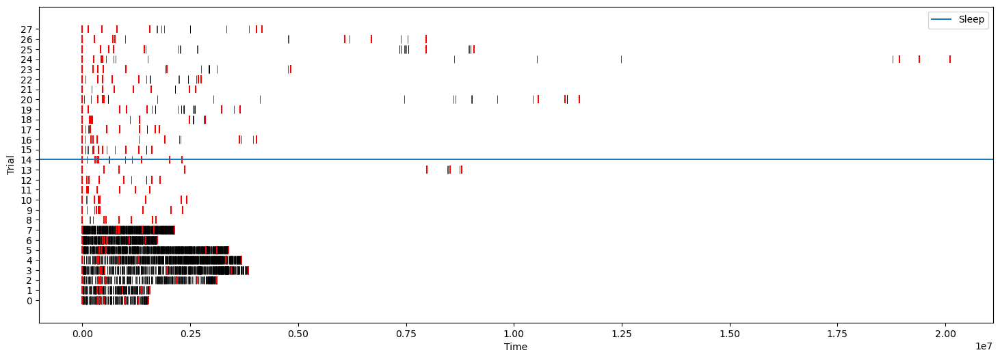

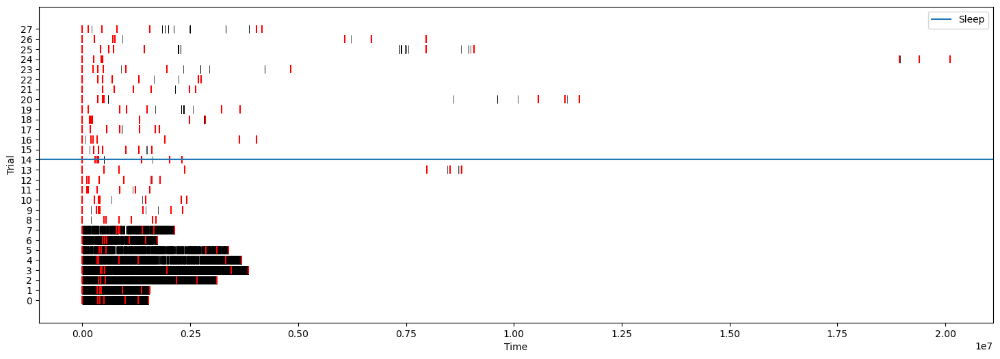

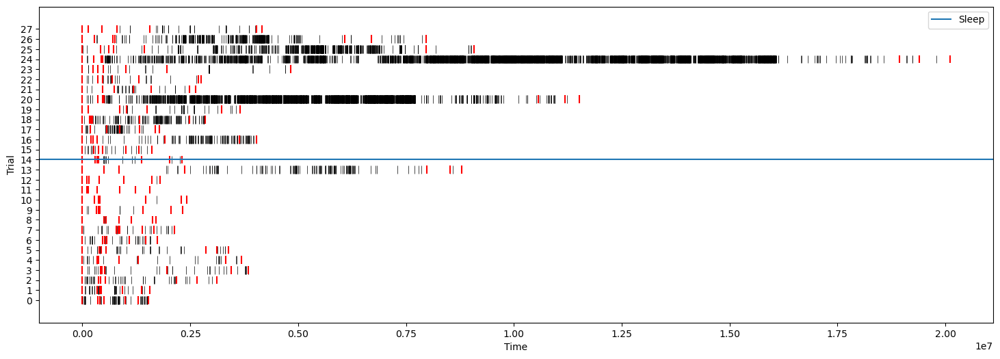

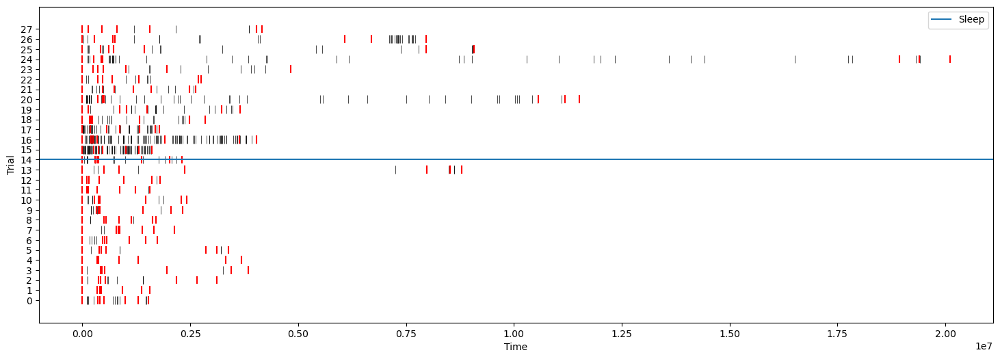

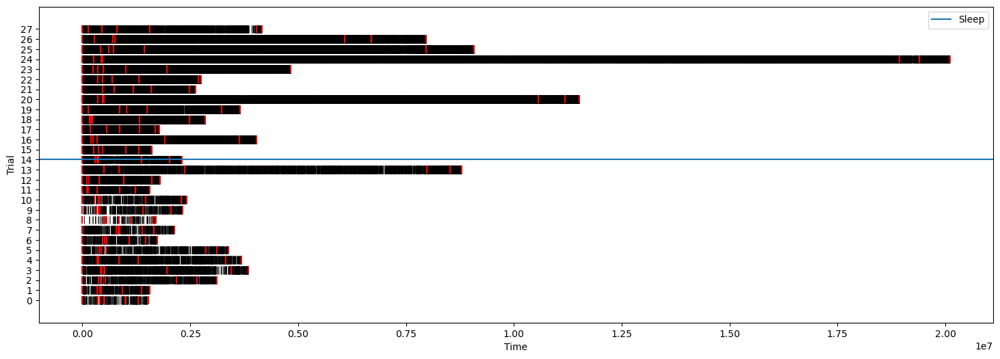

...

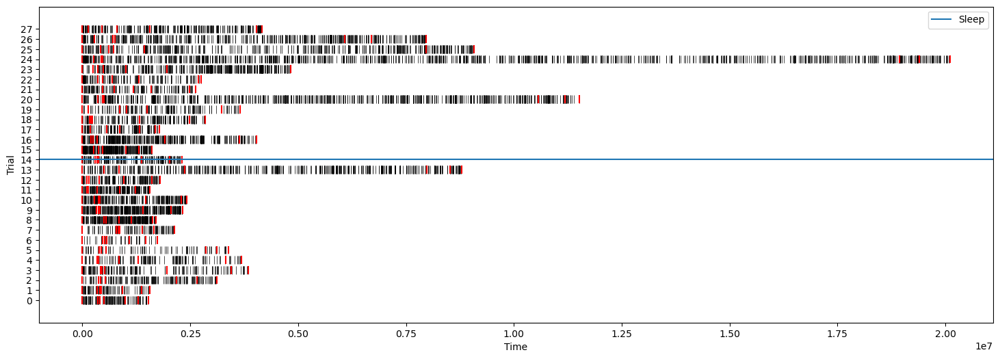

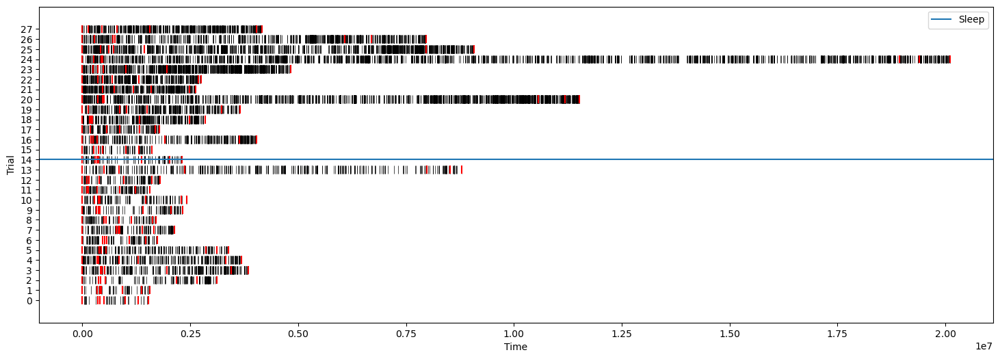

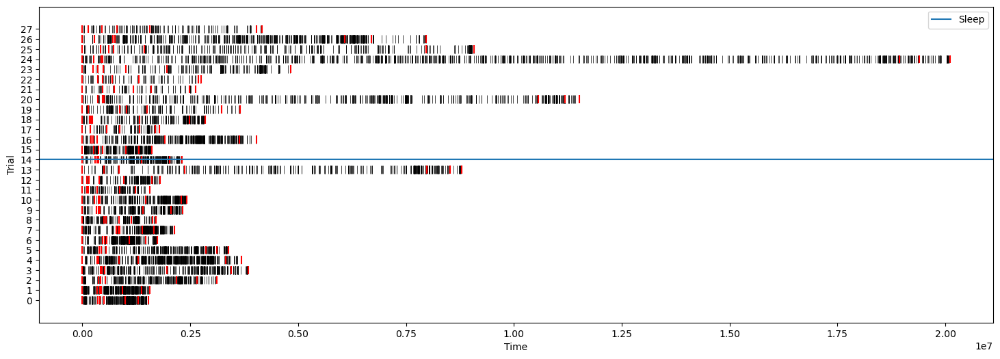

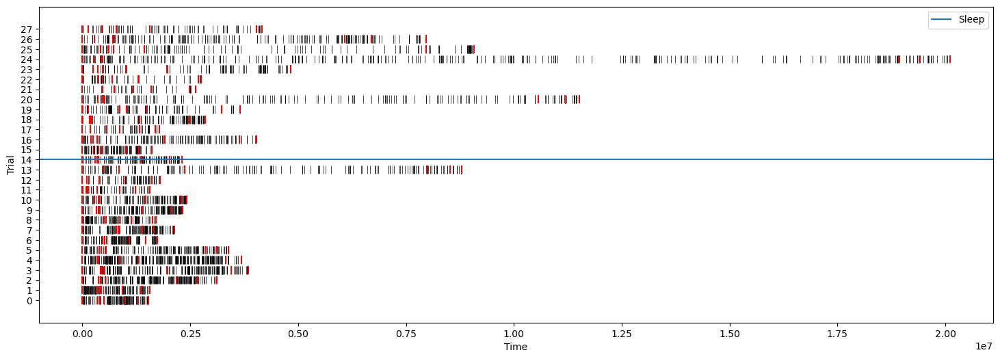

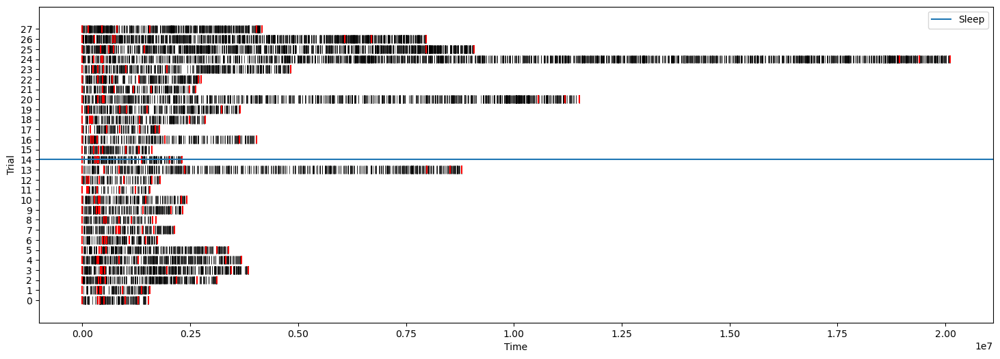

In [5]:
# days = ['20220909','20220910','20220920']
days = ['20220909']

rats = ["JC283"]
maze_type = 'andrea'
time_bin = 25.6      # in ms   20ms is 512 pts    20000/39.0625
clu_sampling = 20000
whl_sampling = 39.0625
whl_to_clu = clu_sampling/whl_sampling

for rat in rats:
    for day in days:
        path = "./m" + rat + "-" + day + "/"
        
        des_path = path + rat + "-" + day + '.des'
    
        with open(des_path, 'r') as file:
            des = np.array(file.read().split())
        
        for cell_id in range(len(des)):
            if des[cell_id] == "pp":
                spike_matrix = []  
                trial_matrix = []

                for training_num in [1,2]:

                    clu_path = path + rat + "-" + day + '_training' + str(training_num) + '.clu'
                    res_path = path+ rat + "-" + day + '_training' + str(training_num) + '.res'
                    spike_times = jcl.load.spike_times_from_res_and_clu( res_path, clu_path, exclude_clusters=[0, 1]  )
                    file_path = path + rat + "-" + day + '_training' + str(training_num) + '.trials'

                    cell_spikes = spike_times[cell_id]

                    with open(file_path,'r') as f:
                        for trial in f:
                            trial = np.array(trial.split(" "), dtype = int)
                            spike_matrix.append( cell_spikes[ (cell_spikes >= trial[0]*whl_to_clu) & (cell_spikes <= trial[-1]*whl_to_clu)] - trial[0]*whl_to_clu) 
                            trial_matrix.append( (trial - trial[0])*whl_to_clu )
#                     print(trial_matrix)
                            ## appending by fixing the start of the trial as time 0
                    f.close()
                    if training_num == 1 :
                        training1_end = len(spike_matrix)
                raster_plot(spike_matrix, training1_end, trial_matrix)

In [ ]:
 df = pd.load_csv("./JC283_data.csv")
# Pivot the DataFrame to get arm distribution by session_id
pivot_df = pd.pivot_table(df, index='Session_ID', columns='Arm', aggfunc='size', fill_value=0)

# Calculate row-wise percentages
row_sums = pivot_df.sum(axis=1)
percentage_df = pivot_df.div(row_sums, axis=0) * 100

# Create a stacked bar plot of percentages
ax = percentage_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set plot labels and title
plt.xlabel('Day')
plt.ylabel('Arm Visit Distribution')
plt.title('Animal ' + animal)

# Show the plot
plt.legend(title='Arm', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [25]:
df = pd.read_csv("./JC283_data.csv")
df = df[df['Session_ID'] == 11].reset_index(drop =True)

CY=[]
CN=[]
SY=[]
SN=[]

for index, row in df.iterrows():
#     print(index, row['Flavor'], row['Correct'])
    if row['Flavor'] == "C":
        if row['Correct'] == "Y":
            CY.append(index)
        else:
            CN.append(index)
    else:
        if row['Correct'] == "Y":
            SY.append(index)
        else:
            SN.append(index)

trial_order = CY + CN + SY + SN 
trial_order        

    
    

[0,
 4,
 5,
 17,
 18,
 21,
 22,
 25,
 26,
 32,
 34,
 35,
 37,
 38,
 39,
 41,
 43,
 44,
 49,
 51,
 54,
 64,
 66,
 68,
 69,
 1,
 2,
 3,
 16,
 36,
 42,
 55,
 58,
 60,
 65,
 7,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 19,
 20,
 23,
 24,
 27,
 28,
 30,
 31,
 33,
 40,
 45,
 46,
 48,
 50,
 52,
 57,
 59,
 61,
 62,
 63,
 67,
 6,
 8,
 29,
 47,
 53,
 56]

0 C Y
1 C N
2 C N
3 C N
4 C Y
5 C Y
6 S N
7 S Y
8 S N
9 S Y
10 S Y
11 S Y
12 S Y
13 S Y
14 S Y
15 S Y
16 C N
17 C Y
18 C Y
19 S Y
20 S Y
21 C Y
22 C Y
23 S Y
24 S Y
25 C Y
26 C Y
27 S Y
28 S Y
29 S N
30 S Y
31 S Y
32 C Y
33 S Y
34 C Y
35 C Y
36 C N
37 C Y
38 C Y
39 C Y
40 S Y
41 C Y
42 C N
43 C Y
44 C Y
45 S Y
46 S Y
47 S N
48 S Y
49 C Y
50 S Y
51 C Y
52 S Y
53 S N
54 C Y
55 C N
56 S N
57 S Y
58 C N
59 S Y
60 C N
61 S Y
62 S Y
63 S Y
64 C Y
65 C N
66 C Y
67 S Y
68 C Y
69 C Y
